## *Environment Setup *




In [ ]:
import os
import sys
import subprocess
import warnings
warnings.filterwarnings("ignore")

def install_package(package):
    try:
        __import__(package)
    except ImportError:
        print(f"Installing {package}...")
        subprocess.check_call([sys.executable, "-m", "pip", "install", package, "-q"])

# Install critical libraries
install_package("ultralytics")
install_package("roboflow")
install_package("seaborn")
install_package("segmentation_models_pytorch")

# Imports
import cv2
import yaml
import torch
import random
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image
from ultralytics import YOLO
from roboflow import Roboflow

# Configuration Class
class Config:
    # Roboflow Credentials (extracted from your notebook)
    API_KEY = "TEoE9TIzrU3jvIMDdYys"
    WORKSPACE = "blue-halo"
    PROJECT = "vegetation-segmentation"
    VERSION = 4

    # Model Settings
    TASK = "segment"       # 'detect' for boxes, 'segment' for polygons
    MODEL_SIZE = "l-seg"   # l-seg (large segmentation) Use s-seg or m-seg for higher accuracy.
    IMG_SIZE = 800  # Increased image size for better detail

    # Training Hyperparameters
    EPOCHS = 50     # Increased epochs for more training cycles
    BATCH_SIZE = 32 # Increased batch size (if GPU memory allows)
    OPTIMIZER = 'auto'
    SEED = 42

    # Directories
    ROOT_DIR = os.getcwd()
    DATASET_DIR = os.path.join(ROOT_DIR, "vegetation-segmentation-4")

def seed_everything(seed=42):
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

seed_everything(Config.SEED)
print("Configuration established. Random seeds locked.")

# Configuration for plots
%matplotlib inline
plt.rcParams['figure.figsize'] = (12, 8)
sns.set_style("darkgrid")

# Hardware Check
print(f"Python: {sys.version.split()[0]}")
print(f"Torch: {torch.__version__}")
if torch.cuda.is_available():
    DEVICE = 0
    print(f"GPU: {torch.cuda.get_device_name(0)}")
else:
    DEVICE = 'cpu'
    print("WARNING: No GPU detected. Training will be extremely slow.")

Installing ultralytics...
Installing roboflow...
Installing segmentation_models_pytorch...
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Configuration established. Random seeds locked.
Python: 3.12.12
Torch: 2.9.0+cu126
GPU: Tesla T4


Configuration



In [ ]:
import os # Ensure os is imported
import random # Ensure random is imported
import numpy as np # Ensure numpy is imported
import torch # Ensure torch is imported

class Config:
    # Roboflow Credentials (extracted from your notebook)
    API_KEY = "TEoE9TIzrU3jvIMDdYys"
    WORKSPACE = "blue-halo"
    PROJECT = "vegetation-segmentation"
    VERSION = 4

    # Model Settings
    TASK = "segment"       # 'detect' for boxes, 'segment' for polygons
    MODEL_SIZE = "l-seg"   # l-seg (large segmentation) Use s-seg or m-seg for higher accuracy.
    IMG_SIZE = 800  # Increased image size for better detail

    # Training Hyperparameters
    EPOCHS = 50     # Increased epochs for more training cycles
    BATCH_SIZE = 32 # Increased batch size (if GPU memory allows)
    OPTIMIZER = 'auto'
    SEED = 42

    # Directories
    ROOT_DIR = os.getcwd()
    DATASET_DIR = os.path.join(ROOT_DIR, "vegetation-segmentation-4")

def seed_everything(seed=42):
    os.environ['PYTHONHASHSEED'] = str(seed)
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

seed_everything(Config.SEED)
print("Configuration established. Random seeds locked.")

Configuration established. Random seeds locked.


Data Acquistion

In [ ]:

if not os.path.exists(Config.DATASET_DIR):
    print(f"Downloading {Config.PROJECT} dataset (Version {Config.VERSION})...")
    rf = Roboflow(api_key=Config.API_KEY)
    project = rf.workspace(Config.WORKSPACE).project(Config.PROJECT)
    version = project.version(Config.VERSION)
    # Important: Download in yolov8 format which supports segmentation
    dataset = version.download("yolov8")
else:
    print(f"Dataset already exists at {Config.DATASET_DIR}")

# Validation: Check for data.yaml
yaml_path = os.path.join(Config.DATASET_DIR, "data.yaml")
if not os.path.exists(yaml_path):
    # Automatic fix if folder structure is nested
    potential_yaml = list(Path(Config.DATASET_DIR).rglob("data.yaml"))
    if potential_yaml:
        yaml_path = str(potential_yaml[0])
        print(f"Fixed YAML path: {yaml_path}")
    else:
        raise FileNotFoundError("data.yaml not found. Download might have failed.")

print(f"Dataset ready. Config file: {yaml_path}")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to vegetation-segmentation-4 in yolov8:: 100%|██████████| 2148/2148 [00:02<00:00, 995.48it/s] 


Dataset ready. Config file: /content/vegetation-segmentation-4/data.yaml


*EDA*

Detected Classes: ['vegetation']


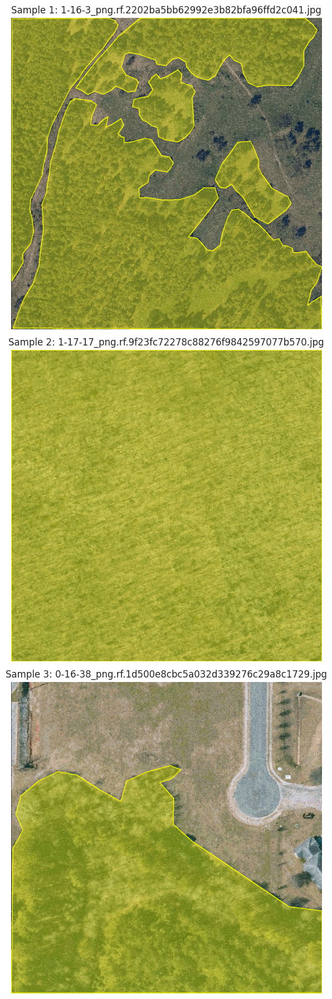

In [ ]:
def parse_yaml_classes(yaml_file):
    with open(yaml_file, 'r') as f:
        d = yaml.safe_load(f)
    return d['names']

class_names = parse_yaml_classes(yaml_path)
print(f"Detected Classes: {class_names}")

def visualize_segmentation_sample(image_dir, label_dir, class_names, num_samples=3):
    image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]
    if not image_files:
        print("No images found to visualize.")
        return

    samples = random.sample(image_files, min(len(image_files), num_samples))

    plt.figure(figsize=(20, 6 * num_samples))

    for i, img_file in enumerate(samples):
        # Load Image
        img_path = os.path.join(image_dir, img_file)
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        h, w, _ = image.shape

        # Create a mask overlay
        overlay = image.copy()

        # Load Label
        label_file = img_file.rsplit('.', 1)[0] + ".txt"
        label_path = os.path.join(label_dir, label_file)

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                lines = f.readlines()

            for line in lines:
                data = list(map(float, line.strip().split()))
                class_id = int(data[0])
                # YOLO Seg format: class x1 y1 x2 y2 ... xn yn (normalized)
                coords = data[1:]

                # Reshape to (N, 1, 2) for cv2.polylines
                points = []
                for j in range(0, len(coords), 2):
                    px = int(coords[j] * w)
                    py = int(coords[j+1] * h)
                    points.append([px, py])

                pts = np.array(points, np.int32)
                pts = pts.reshape((-1, 1, 2))

                # Color based on class ID (Golden/Green colors for vegetation)
                color = [(255, 255, 0), (0, 255, 0), (0, 255, 255)][class_id % 3]

                # Draw filled polygon
                cv2.fillPoly(overlay, [pts], color)

                # Draw contours
                cv2.polylines(image, [pts], True, color, 2)

        # Blend overlay with original image
        alpha = 0.4
        image_with_masks = cv2.addWeighted(overlay, alpha, image, 1 - alpha, 0)

        plt.subplot(num_samples, 1, i + 1)
        plt.imshow(image_with_masks)
        plt.axis('off')
        plt.title(f"Sample {i+1}: {img_file}")

    plt.tight_layout()
    plt.show()

# Run Visualization on Train Set
train_img_dir = os.path.join(Config.DATASET_DIR, "train", "images")
train_lbl_dir = os.path.join(Config.DATASET_DIR, "train", "labels")
visualize_segmentation_sample(train_img_dir, train_lbl_dir, class_names)

## Train the YOLO Segmentation Model

### Subtask:
Train the initialized YOLO segmentation model using the `data.yaml` file and the `EPOCHS`, `IMG_SIZE`, and `BATCH_SIZE` specified in the `Config` class, leveraging the GPU for training if available.

### Instructions
1. Call the `train` method on the `yolo_model` object.
2. Pass the following arguments to the `train` method:
    - `data`: The path to the `data.yaml` file (stored in `yaml_path`).
    - `epochs`: The number of training epochs (from `Config.EPOCHS`).
    - `imgsz`: The image size for training (from `Config.IMG_SIZE`).
    - `batch`: The batch size for training (from `Config.BATCH_SIZE`).
    - `device`: The device to use for training (from `DEVICE`, which is '0' for GPU or 'cpu').
    - `project`: A name for the training project, e.g., 'yolo_segmentation_training'.
    - `name`: A name for this specific run, e.g., 'vegetation_seg_run'.
    - `seed`: For reproducibility (from `Config.SEED`).

**Reasoning**:
I will now proceed with training the initialized YOLO segmentation model using the parameters defined in the `Config` class and the `yaml_path` for the dataset, as outlined in the previous markdown block.



In [ ]:
results = yolo_model.train(
    data=yaml_path,
    epochs=Config.EPOCHS,
    imgsz=Config.IMG_SIZE,
    batch=Config.BATCH_SIZE,
    device=DEVICE,
    project='yolo_segmentation_training',
    name='vegetation_seg_run',
    seed=Config.SEED
)
print("Model training complete.")

Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/vegetation-segmentation-4/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8l-seg.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=vegetation_seg_run, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, persp

In [ ]:
# This cell is now empty as its contents have been moved to PIqLKOasbIYJ for better code organization and to prevent NameErrors.

In [ ]:
import os
import sys
import cv2 # Added for image processing within YOLOSegDataset
import numpy as np # Added for numerical operations
import torch # Added for torch functions and tensors
import torch.nn as nn # Added for CrossEntropyLoss and other nn modules
from torch.utils.data import Dataset, DataLoader # Added for Dataset and DataLoader
from torch.cuda.amp import GradScaler, autocast # Added for mixed precision training
from tqdm.notebook import tqdm # Added for progress bars
import yaml
from pathlib import Path

# Local training configuration for U-Net/DeepLabV3+ (these are not part of the global Config)
# Note: Config class is imported from cell H-4JD82B2qcJ, these are local overrides for U-Net/DeepLabV3+ training
BATCH_SIZE = 16  # Increased batch size for U-Net/DeepLabV3+
IMG_SIZE = 640  # Increased image size for U-Net/DeepLabV3+
LR = 0.0001    # Adjusted learning rate (can be tuned up or down)
EPOCHS = 20     # Increased epochs for U-Net/DeepLabV3+

# --- 1. The Dataset Class (Moved from zlWV8wV_bBNA) ---
class YOLOSegDataset(Dataset):
    def __init__(self, img_dir, label_dir, classes, img_size=320):
        self.img_dir = img_dir
        self.label_dir = label_dir
        self.classes = classes
        self.img_size = img_size
        self.image_files = sorted([f for f in os.listdir(img_dir) if f.endswith(('.jpg', '.png', '.jpeg'))])

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        # Load Image
        img_name = self.image_files[idx]
        img_path = os.path.join(self.img_dir, img_name)
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        h, w = image.shape[:2]

        # Create Mask
        mask = np.zeros((h, w), dtype=np.float32)
        label_file = img_name.rsplit('.', 1)[0] + ".txt"
        label_path = os.path.join(self.label_dir, label_file)

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                lines = f.readlines()
            for line in lines:
                data = list(map(float, line.strip().split()))
                class_id = int(data[0])
                coords = data[1:]
                points = []
                for j in range(0, len(coords), 2):
                    px = int(coords[j] * w)
                    py = int(coords[j+1] * h)
                    points.append([px, py])
                pts = np.array(points, np.int32).reshape((-1, 1, 2))
                cv2.fillPoly(mask, [pts], class_id + 1.0)

        # Resize & Normalize
        image = cv2.resize(image, (self.img_size, self.img_size))
        mask = cv2.resize(mask, (self.img_size, self.img_size), interpolation=cv2.INTER_NEAREST)

        image = image.astype("float32") / 255.0
        image = np.transpose(image, (2, 0, 1))

        return torch.tensor(image, dtype=torch.float32), torch.tensor(mask, dtype=torch.long)

# --- 2. metrics Helper Class (Moved from zlWV8wV_bBNA) ---
class MetricMonitor:
    def __init__(self):
        self.reset()
    def reset(self):
        self.val = 0
        self.sum = 0
        self.count = 0
        self.avg = 0
    def update(self, val, n=1):
        self.val = val
        self.sum += val * n
        self.count += n
        self.avg = self.sum / self.count

# --- 3. Calculation Helper (Moved from zlWV8wV_bBNA) ---
def calculate_iou_dice(pred_mask, true_mask, num_classes):
    pred_mask = pred_mask.view(-1)
    true_mask = true_mask.view(-1)
    iou_list, dice_list = [], []

    for cls in range(num_classes):
        pred_inds = (pred_mask == cls)
        target_inds = (true_mask == cls)
        intersection = (pred_inds & target_inds).sum().item()
        union = (pred_inds | target_inds).sum().item()

        if union == 0:
            iou_list.append(1.0) # If union is zero, both are empty, consider it perfect match
        else:
            iou_list.append(intersection / union)

        total = pred_inds.sum().item() + target_inds.sum().item()
        if total == 0:
            dice_list.append(1.0) # If total is zero, both are empty, consider it perfect match
        else:
            dice_list.append(2 * intersection / total)

    return np.mean(iou_list), np.mean(dice_list)

# --- 4. Training Engine (Moved from zlWV8wV_bBNA) ---
def train_epoch(model, loader, optimizer, loss_fn, scaler):
    model.train()
    monitor = MetricMonitor()
    # Ensure DEVICE is defined, assuming it's available from a prior environment setup cell
    for images, masks in tqdm(loader, desc="  Train", leave=False):
        images, masks = images.to(DEVICE), masks.to(DEVICE)
        optimizer.zero_grad()
        with autocast():
            outputs = model(images)
            loss = loss_fn(outputs, masks)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        monitor.update(loss.item(), images.size(0))
    return monitor.avg

def validate_epoch(model, loader, loss_fn, num_classes):
    model.eval()
    iou_monitor = MetricMonitor()
    dice_monitor = MetricMonitor()
    # Ensure DEVICE is defined, assuming it's available from a prior environment setup cell
    with torch.no_grad():
        for images, masks in tqdm(loader, desc="  Val", leave=False):
            images, masks = images.to(DEVICE), masks.to(DEVICE)
            outputs = model(images)
            preds = torch.argmax(outputs, dim=1)
            # No need for loss in validation, just metrics
            iou, dice = calculate_iou_dice(preds, masks, num_classes)
            iou_monitor.update(iou, images.size(0))
            dice_monitor.update(dice, images.size(0))
    return 0.0, iou_monitor.avg, dice_monitor.avg # Returning 0.0 for loss as it's not calculated here

print("Foundation built: 'YOLOSegDataset' and helper functions.")


# parse_yaml_classes is needed here, relying on Config already being loaded.
def parse_yaml_classes(yaml_file):
    with open(yaml_file, 'r') as f:
        d = yaml.safe_load(f)
    return d['names']

class_names = parse_yaml_classes(yaml_path)
print(f"Detected Classes for Dataset setup: {class_names}")

# Define Paths
train_img = os.path.join(Config.DATASET_DIR, "train", "images")
train_lbl = os.path.join(Config.DATASET_DIR, "train", "labels")
valid_img = os.path.join(Config.DATASET_DIR, "valid", "images")
valid_lbl = os.path.join(Config.DATASET_DIR, "valid", "labels")

# Initialize Datasets
# n_classes should be available from Config in H-4JD82B2qcJ, but redefined here for robustness
n_classes = len(class_names) + 1 # +1 for background
train_ds = YOLOSegDataset(train_img, train_lbl, class_names, img_size=IMG_SIZE)
valid_ds = YOLOSegDataset(valid_img, valid_lbl, class_names, img_size=IMG_SIZE)

# Initialize Loaders
# Set drop_last=True to avoid batches with a single image, which can cause BatchNorm errors
train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=0, drop_last=True)
valid_loader = DataLoader(valid_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=0, drop_last=True)

print(f"Data ready. Classes: {n_classes} (including background)")

Foundation built: 'YOLOSegDataset' and helper functions.


NameError: name 'yaml_path' is not defined

In [ ]:
import torch
import sys
import subprocess # Added for install_package

def install_package(package):
    try:
        __import__(package)
    except ImportError:
        print(f"Installing {package}...")
        subprocess.check_call([sys.executable, "-m", "pip", "install", package, "-q"])

install_package("segmentation_models_pytorch") # Ensure installation
import segmentation_models_pytorch as smp # Imported smp here

# Hardware Check (Copied from Environment Setup for robustness)
if torch.cuda.is_available():
    DEVICE = 0
    print(f"GPU: {torch.cuda.get_device_name(0)}")
else:
    DEVICE = 'cpu'
    print("WARNING: No GPU detected. Training will be extremely slow.")

# 1. Initialize U-Net
unet_model = smp.Unet(
    encoder_name="resnet34",        # Backbone
    encoder_weights="imagenet",     # Pre-trained knowledge
    in_channels=3,
    classes=n_classes
)
unet_model.to(DEVICE)

# 2. Setup Optimizer & Loss
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(unet_model.parameters(), lr=LR)
scaler = GradScaler()

# 3. Training Loop for U-Net
unet_best_iou = 0.0
unet_history = {'train_loss': [], 'val_iou': []}

for epoch in range(EPOCHS):
    # Train
    t_loss = train_epoch(unet_model, train_loader, optimizer, loss_fn, scaler)

    # Validate
    v_loss, v_iou, v_dice = validate_epoch(unet_model, valid_loader, loss_fn, n_classes)

    # Record
    unet_history['train_loss'].append(t_loss)
    unet_history['val_iou'].append(v_iou)

    print(f"U-Net Epoch {epoch+1}/{EPOCHS} | Train Loss: {t_loss:.4f} | Val IoU: {v_iou:.4f}")

    # Save Best U-Net
    if v_iou > unet_best_iou:
        unet_best_iou = v_iou
        torch.save(unet_model.state_dict(), "best_unet.pth")
        print(f"--> Best U-Net Saved! (IoU: {v_iou:.4f})")

print(f"\nFinal U-Net Best IoU: {unet_best_iou:.4f}")

Installing segmentation_models_pytorch...
GPU: Tesla T4



The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.


config.json:   0%|          | 0.00/156 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/87.3M [00:00<?, ?B/s]

`torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.


  Train:   0%|          | 0/59 [00:00<?, ?it/s]

`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.


  Val:   0%|          | 0/5 [00:00<?, ?it/s]

U-Net Epoch 1/20 | Train Loss: 0.3636 | Val IoU: 0.8815
--> Best U-Net Saved! (IoU: 0.8815)


  Train:   0%|          | 0/59 [00:00<?, ?it/s]

  Val:   0%|          | 0/5 [00:00<?, ?it/s]

U-Net Epoch 2/20 | Train Loss: 0.2053 | Val IoU: 0.8925
--> Best U-Net Saved! (IoU: 0.8925)


  Train:   0%|          | 0/59 [00:00<?, ?it/s]

  Val:   0%|          | 0/5 [00:00<?, ?it/s]

U-Net Epoch 3/20 | Train Loss: 0.1671 | Val IoU: 0.9018
--> Best U-Net Saved! (IoU: 0.9018)


  Train:   0%|          | 0/59 [00:00<?, ?it/s]

  Val:   0%|          | 0/5 [00:00<?, ?it/s]

U-Net Epoch 4/20 | Train Loss: 0.1334 | Val IoU: 0.9064
--> Best U-Net Saved! (IoU: 0.9064)


  Train:   0%|          | 0/59 [00:00<?, ?it/s]

  Val:   0%|          | 0/5 [00:00<?, ?it/s]

U-Net Epoch 5/20 | Train Loss: 0.1394 | Val IoU: 0.9207
--> Best U-Net Saved! (IoU: 0.9207)


  Train:   0%|          | 0/59 [00:00<?, ?it/s]

  Val:   0%|          | 0/5 [00:00<?, ?it/s]

U-Net Epoch 6/20 | Train Loss: 0.0985 | Val IoU: 0.8850


  Train:   0%|          | 0/59 [00:00<?, ?it/s]

  Val:   0%|          | 0/5 [00:00<?, ?it/s]

U-Net Epoch 7/20 | Train Loss: 0.0837 | Val IoU: 0.9151


  Train:   0%|          | 0/59 [00:00<?, ?it/s]

  Val:   0%|          | 0/5 [00:00<?, ?it/s]

U-Net Epoch 8/20 | Train Loss: 0.0715 | Val IoU: 0.9204


  Train:   0%|          | 0/59 [00:00<?, ?it/s]

  Val:   0%|          | 0/5 [00:00<?, ?it/s]

U-Net Epoch 9/20 | Train Loss: 0.0594 | Val IoU: 0.9164


  Train:   0%|          | 0/59 [00:00<?, ?it/s]

  Val:   0%|          | 0/5 [00:00<?, ?it/s]

U-Net Epoch 10/20 | Train Loss: 0.0570 | Val IoU: 0.8987


  Train:   0%|          | 0/59 [00:00<?, ?it/s]

  Val:   0%|          | 0/5 [00:00<?, ?it/s]

U-Net Epoch 11/20 | Train Loss: 0.0846 | Val IoU: 0.9038


  Train:   0%|          | 0/59 [00:00<?, ?it/s]

  Val:   0%|          | 0/5 [00:00<?, ?it/s]

U-Net Epoch 12/20 | Train Loss: 0.0671 | Val IoU: 0.9215
--> Best U-Net Saved! (IoU: 0.9215)


  Train:   0%|          | 0/59 [00:00<?, ?it/s]

  Val:   0%|          | 0/5 [00:00<?, ?it/s]

U-Net Epoch 13/20 | Train Loss: 0.0600 | Val IoU: 0.9069


  Train:   0%|          | 0/59 [00:00<?, ?it/s]

  Val:   0%|          | 0/5 [00:00<?, ?it/s]

U-Net Epoch 14/20 | Train Loss: 0.0625 | Val IoU: 0.8961


  Train:   0%|          | 0/59 [00:00<?, ?it/s]

  Val:   0%|          | 0/5 [00:00<?, ?it/s]

U-Net Epoch 15/20 | Train Loss: 0.0625 | Val IoU: 0.8993


  Train:   0%|          | 0/59 [00:00<?, ?it/s]

  Val:   0%|          | 0/5 [00:00<?, ?it/s]

U-Net Epoch 16/20 | Train Loss: 0.0776 | Val IoU: 0.9071


  Train:   0%|          | 0/59 [00:00<?, ?it/s]

  Val:   0%|          | 0/5 [00:00<?, ?it/s]

U-Net Epoch 17/20 | Train Loss: 0.0498 | Val IoU: 0.9152


  Train:   0%|          | 0/59 [00:00<?, ?it/s]

  Val:   0%|          | 0/5 [00:00<?, ?it/s]

U-Net Epoch 18/20 | Train Loss: 0.0411 | Val IoU: 0.9105


  Train:   0%|          | 0/59 [00:00<?, ?it/s]

  Val:   0%|          | 0/5 [00:00<?, ?it/s]

U-Net Epoch 19/20 | Train Loss: 0.0394 | Val IoU: 0.9163


  Train:   0%|          | 0/59 [00:00<?, ?it/s]

  Val:   0%|          | 0/5 [00:00<?, ?it/s]

U-Net Epoch 20/20 | Train Loss: 0.0356 | Val IoU: 0.9170

Final U-Net Best IoU: 0.9215


In [ ]:
# Training DeepLabV3+

# 1. Initialize DeepLabV3+
deeplab_model = smp.DeepLabV3Plus(
    encoder_name="resnet34",        # Same backbone for fair comparison
    encoder_weights="imagenet",
    in_channels=3,
    classes=n_classes
)
deeplab_model.to(DEVICE)

# 2. Setup Optimizer & Loss (Resetting optimizer for new model)
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(deeplab_model.parameters(), lr=LR)
scaler = GradScaler()

# 3. Training Loop for DeepLabV3+
deeplab_best_iou = 0.0
deeplab_history = {'train_loss': [], 'val_iou': []}

for epoch in range(EPOCHS):
    # Train
    t_loss = train_epoch(deeplab_model, train_loader, optimizer, loss_fn, scaler)

    # Validate
    v_loss, v_iou, v_dice = validate_epoch(deeplab_model, valid_loader, loss_fn, n_classes)

    # Record
    deeplab_history['train_loss'].append(t_loss)
    deeplab_history['val_iou'].append(v_iou)

    print(f"DeepLab Epoch {epoch+1}/{EPOCHS} | Train Loss: {t_loss:.4f} | Val IoU: {v_iou:.4f}")

    # Save Best DeepLab
    if v_iou > deeplab_best_iou:
        deeplab_best_iou = v_iou
        torch.save(deeplab_model.state_dict(), "best_deeplab.pth")
        print(f"--> Best DeepLab Saved! (IoU: {v_iou:.4f})")

print(f"\nFinal DeepLab Best IoU: {deeplab_best_iou:.4f}")

`torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

`torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.


  Val:   0%|          | 0/10 [00:00<?, ?it/s]

DeepLab Epoch 1/10 | Train Loss: 0.3099 | Val IoU: 0.8382
--> Best DeepLab Saved! (IoU: 0.8382)


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

DeepLab Epoch 2/10 | Train Loss: 0.2440 | Val IoU: 0.8919
--> Best DeepLab Saved! (IoU: 0.8919)


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

DeepLab Epoch 3/10 | Train Loss: 0.2186 | Val IoU: 0.8668


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

DeepLab Epoch 4/10 | Train Loss: 0.2291 | Val IoU: 0.8940
--> Best DeepLab Saved! (IoU: 0.8940)


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

DeepLab Epoch 5/10 | Train Loss: 0.2069 | Val IoU: 0.8877


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

DeepLab Epoch 6/10 | Train Loss: 0.1942 | Val IoU: 0.8480


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

DeepLab Epoch 7/10 | Train Loss: 0.1976 | Val IoU: 0.8819


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

DeepLab Epoch 8/10 | Train Loss: 0.1565 | Val IoU: 0.9024
--> Best DeepLab Saved! (IoU: 0.9024)


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

DeepLab Epoch 9/10 | Train Loss: 0.1789 | Val IoU: 0.8537


  Train:   0%|          | 0/118 [00:00<?, ?it/s]

  Val:   0%|          | 0/10 [00:00<?, ?it/s]

DeepLab Epoch 10/10 | Train Loss: 0.1527 | Val IoU: 0.8834

Final DeepLab Best IoU: 0.9024


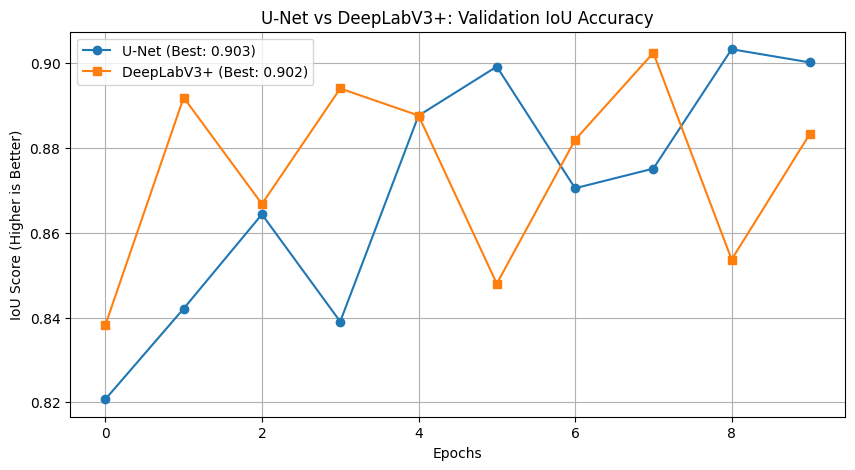

🏆 WINNER: U-Net is better by 0.0009 IoU points.


In [ ]:
# Compare Training Progress
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.plot(unet_history['val_iou'], label=f'U-Net (Best: {unet_best_iou:.3f})', marker='o')
plt.plot(deeplab_history['val_iou'], label=f'DeepLabV3+ (Best: {deeplab_best_iou:.3f})', marker='s')
plt.title("U-Net vs DeepLabV3+: Validation IoU Accuracy")
plt.xlabel("Epochs")
plt.ylabel("IoU Score (Higher is Better)")
plt.legend()
plt.grid(True)
plt.show()

# Final Verdict
if unet_best_iou > deeplab_best_iou:
    print(f"🏆 WINNER: U-Net is better by {(unet_best_iou - deeplab_best_iou):.4f} IoU points.")
else:
    print(f"🏆 WINNER: DeepLabV3+ is better by {(deeplab_best_iou - unet_best_iou):.4f} IoU points.")

## Train the YOLO Segmentation Model (Re-run)

This cell will load a pretrained YOLO segmentation model, configure it with the specified hyperparameters from the `Config` class, and then initiate the training process. The training will use the dataset defined by `yaml_path` and save the best performing model. This is a re-run of the YOLO model training, potentially with updated parameters or a fresh start.

In [ ]:
import sys
import subprocess

def install_package(package):
    try:
        __import__(package)
    except ImportError:
        print(f"Installing {package}...")
        subprocess.check_call([sys.executable, "-m", "pip", "install", package, "-q"])

install_package("ultralytics")

from ultralytics import YOLO

# Load a pretrained segmentation model
model = YOLO(f"yolov8{Config.MODEL_SIZE}.pt")

print(f"Initializing {Config.TASK} training on {DEVICE}...")

# Train
results = model.train(
    data=yaml_path,
    epochs=Config.EPOCHS,
    imgsz=Config.IMG_SIZE,
    batch=Config.BATCH_SIZE,
    device=DEVICE,
    optimizer=Config.OPTIMIZER,
    seed=Config.SEED,
    box=7.5,      # Box loss gain
    cls=0.5,      # Class loss gain
    dfl=1.5,      # Distribution Focal Loss gain
    # Segmentation specific arg (mask ratio) is handled automatically by -seg weights
    project='yolo_segmentation_training_rerun',
    name='vegetation_seg_run_rerun',
    plots=True,
    save=True,
    val=True,
    verbose=True
)

print(f"Training finished. Best model saved at: {results.save_dir}")

Installing ultralytics...
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Initializing segment training on 0...
Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/vegetation-segmentation-4/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=30, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=Fals

# Evaluation Metrics

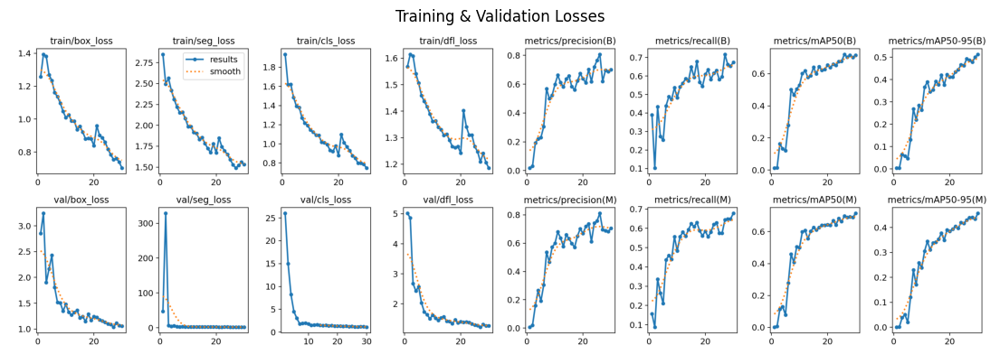

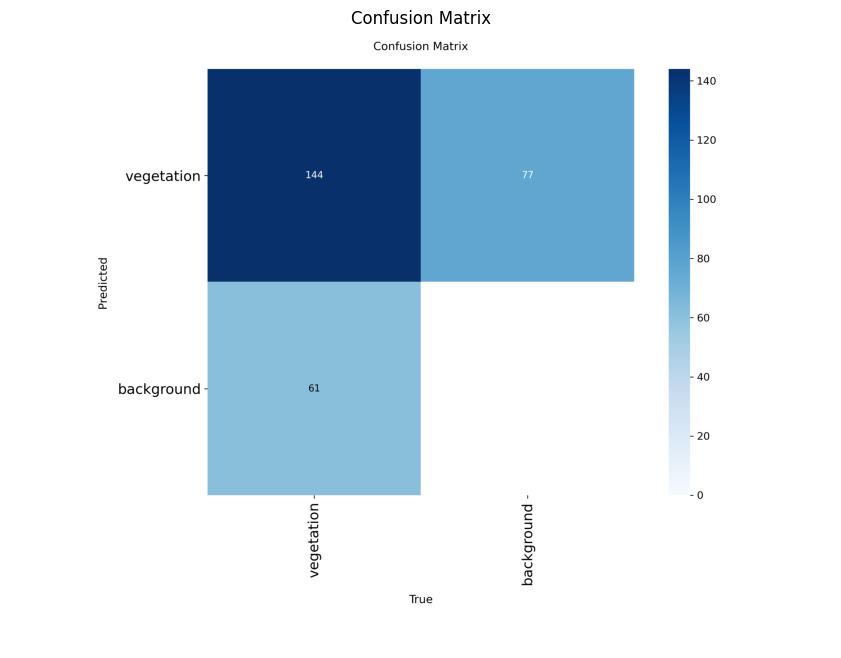

Accessing detailed metrics...
Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv8l-seg summary (fused): 125 layers, 45,912,659 parameters, 0 gradients, 210.1 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 31.6±12.0 MB/s, size: 106.7 KB)
val: Scanning /content/vegetation-segmentation-4/test/labels... 40 images, 5 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 40/40 561.7it/s 0.1s
val: New cache created: /content/vegetation-segmentation-4/test/labels.cache
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 3/3 1.2s/it 3.6s
                   all         40         99      0.574      0.717      0.657      0.445      0.603       0.72      0.698      0.398
Speed: 8.4ms preprocess, 48.9ms inference, 0.0ms loss, 4.6ms postprocess per image
Results saved to /content/runs/segment/val

 SEGMENTATION METRICS (Test Set)
Mask mAP@50:    0.6975
Mask mAP@50-9

In [ ]:
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt
from ultralytics import YOLO

results_dir = Path(results.save_dir)

# Helper to show images
def show_results_plot(file_name, title):
    p = results_dir / file_name
    if p.exists():
        img = Image.open(p)
        plt.figure(figsize=(14, 8))
        plt.imshow(img)
        plt.axis('off')
        plt.title(title)
        plt.show()
    else:
        print(f"File {file_name} not generated yet.")

# Plot Loss Curves
show_results_plot("results.png", "Training & Validation Losses")

# Plot Confusion Matrix
show_results_plot("confusion_matrix.png", "Confusion Matrix")

# Print precise metrics
# Note: YOLOv8 logs both Box (detection) and Mask (segmentation) metrics
print("Accessing detailed metrics...")
try:
    # Reload best model for validation
    best_model = YOLO(results_dir / "weights" / "best.pt")
    metrics = best_model.val(split='test')

    print("\n" + "="*40)
    print(" SEGMENTATION METRICS (Test Set)")
    print("="*40)
    print(f"Mask mAP@50:    {metrics.seg.map50:.4f}")
    print(f"Mask mAP@50-95: {metrics.seg.map:.4f}")
    print("-" * 40)
    print(" BOX METRICS (Test Set)")
    print("-" * 40)
    print(f"Box  mAP@50:    {metrics.box.map50:.4f}")
    print(f"Box  mAP@50-95: {metrics.box.map:.4f}")
    print("="*40)
except Exception as e:
    print(f"Could not run automated metric printing: {e}")

 Inference on Test Data

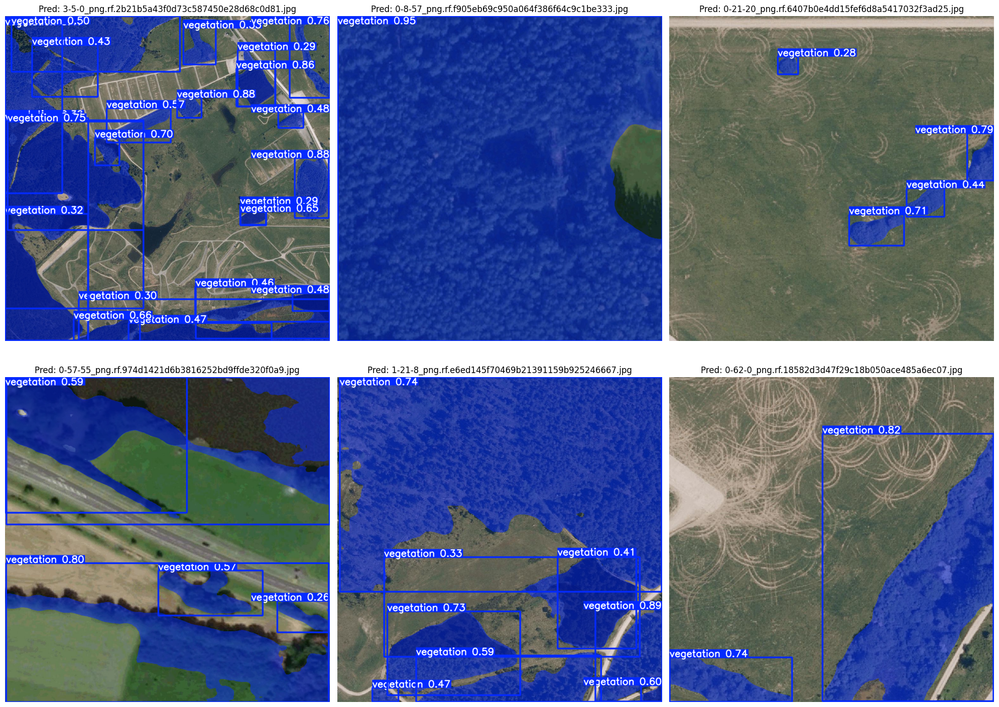

In [ ]:
test_images_dir = os.path.join(Config.DATASET_DIR, "test", "images")
if not os.path.exists(test_images_dir):
    # Fallback to valid if test doesn't exist
    test_images_dir = os.path.join(Config.DATASET_DIR, "valid", "images")

test_files = [f for f in os.listdir(test_images_dir) if f.endswith(('.jpg', '.png'))]
sample_test_files = random.sample(test_files, min(len(test_files), 6))

# Load best model
best_model_path = results_dir / "weights" / "best.pt"
best_model = YOLO(best_model_path)

plt.figure(figsize=(20, 15))
for i, file_name in enumerate(sample_test_files):
    img_path = os.path.join(test_images_dir, file_name)

    # Predict
    # retina_masks=True gives higher quality masks
    results = best_model.predict(source=img_path, conf=0.25, retina_masks=True, verbose=False)

    # Plot using Ultralytics' built-in plotter which handles masks beautifully
    res_plotted = results[0].plot()
    res_rgb = cv2.cvtColor(res_plotted, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 3, i + 1)
    plt.imshow(res_rgb)
    plt.axis('off')
    plt.title(f"Pred: {file_name}")

plt.tight_layout()
plt.show()

In [ ]:
print("Exporting model...")

# Export to ONNX
try:
    path_onnx = best_model.export(format="onnx")
    print(f"ONNX model saved at: {path_onnx}")
except Exception as e:
    print(f"ONNX export failed: {e}")

# Download trigger for Google Colab
if 'google.colab' in sys.modules:
    from google.colab import files
    if os.path.exists(path_onnx):
        files.download(path_onnx)

Exporting model...
Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CPU (Intel Xeon CPU @ 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/

PyTorch: starting from '/content/yolo_segmentation_training_rerun/vegetation_seg_run_rerun/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) ((1, 37, 8400), (1, 32, 160, 160)) (88.0 MB)
requirements: Ultralytics requirements ['onnx>=1.12.0,<2.0.0', 'onnxslim>=0.1.71', 'onnxruntime-gpu'] not found, attempting AutoUpdate...
Using Python 3.12.12 environment at: /usr
Resolved 14 packages in 188ms
Prepared 6 packages in 11.78s
Installed 6 packages in 249ms
 + colorama==0.4.6
 + coloredlogs==15.0.1
 + humanfriendly==10.0
 + onnx==1.20.0
 + onnxruntime-gpu==1.23.2
 + onnxslim==0.1.80

requirements: AutoUpdate success ✅ 12.8s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


ONNX: startin

Exporting to ONNX opset version 22 is not supported. by 'torch.onnx.export()'. The highest opset version supported is 20. To use a newer opset version, consider 'torch.onnx.export(..., dynamo=True)'. 


ONNX: slimming with onnxslim 0.1.80...
ONNX: export success ✅ 26.5s, saved as '/content/yolo_segmentation_training_rerun/vegetation_seg_run_rerun/weights/best.onnx' (175.4 MB)

Export complete (31.7s)
Results saved to /content/yolo_segmentation_training_rerun/vegetation_seg_run_rerun/weights
Predict:         yolo predict task=segment model=/content/yolo_segmentation_training_rerun/vegetation_seg_run_rerun/weights/best.onnx imgsz=640  
Validate:        yolo val task=segment model=/content/yolo_segmentation_training_rerun/vegetation_seg_run_rerun/weights/best.onnx imgsz=640 data=/content/vegetation-segmentation-4/data.yaml  
Visualize:       https://netron.app
ONNX model saved at: /content/yolo_segmentation_training_rerun/vegetation_seg_run_rerun/weights/best.onnx


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
print("Exporting model...")

# Export to ONNX
try:
    path_onnx = best_model.export(format="onnx")
    print(f"ONNX model saved at: {path_onnx}")
except Exception as e:
    print(f"ONNX export failed: {e}")

# Download trigger for Google Colab
if 'google.colab' in sys.modules:
    from google.colab import files
    if os.path.exists(path_onnx):
        files.download(path_onnx)

Exporting model...
Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CPU (Intel Xeon CPU @ 2.00GHz)

PyTorch: starting from '/content/yolo_segmentation_training_rerun/vegetation_seg_run_rerun/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) ((1, 37, 8400), (1, 32, 160, 160)) (88.0 MB)

ONNX: starting export with onnx 1.20.0 opset 22...
ONNX: slimming with onnxslim 0.1.80...
ONNX: export success ✅ 8.9s, saved as '/content/yolo_segmentation_training_rerun/vegetation_seg_run_rerun/weights/best.onnx' (175.4 MB)

Export complete (14.2s)
Results saved to /content/yolo_segmentation_training_rerun/vegetation_seg_run_rerun/weights
Predict:         yolo predict task=segment model=/content/yolo_segmentation_training_rerun/vegetation_seg_run_rerun/weights/best.onnx imgsz=640  
Validate:        yolo val task=segment model=/content/yolo_segmentation_training_rerun/vegetation_seg_run_rerun/weights/best.onnx imgsz=640 data=/content/vegetation-segmentation-4/data.yaml  


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

YOLO detected 8 objects. handing over to SAM 2...


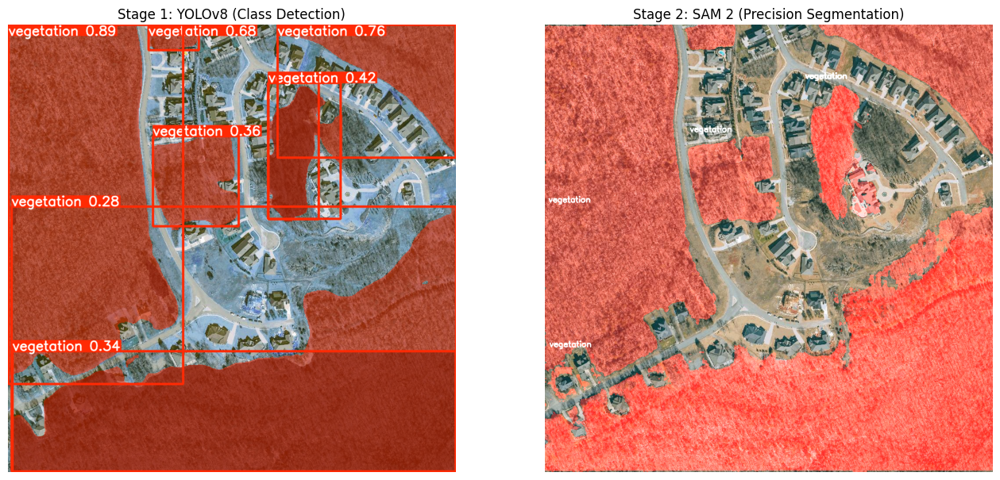

In [ ]:
from ultralytics import YOLO, SAM # Added SAM import
import os # Ensure os is imported
import random # Ensure random is imported
import matplotlib.pyplot as plt # Ensure matplotlib.pyplot is imported
import cv2 # Ensure cv2 is imported
import numpy as np # Ensure numpy is imported

# 1. Load TRAINED YOLO model
# Use the results_dir from the previous YOLO training run to correctly locate the best model.
yolo_model = YOLO(results_dir / "weights" / "best.pt")

# 2. Load the SAM 2 Model
# Options: sam2.1_t.pt (tiny), sam2.1_s.pt (small), sam2.1_b.pt (base), sam2.1_l.pt (large)
sam_model = SAM("sam2.1_s.pt")

def hybrid_inference(image_path):
    """
    1. Detects objects using YOLO (for Class ID).
    2. Refines masks using SAM 2 (for Precision).
    """
    # A. Run YOLO Inference
    yolo_results = yolo_model(image_path, verbose=False)[0]

    # Extract Bounding Boxes from YOLO
    boxes = yolo_results.boxes.xyxy.cpu().numpy()
    class_ids = yolo_results.boxes.cls.cpu().numpy().astype(int)
    class_names = yolo_results.names

    if len(boxes) == 0:
        print("No vegetation detected by YOLO.")
        return

    print(f"YOLO detected {len(boxes)} objects. handing over to SAM 2...")

    # B. Run SAM 2 Inference using YOLO boxes as prompts
    # This tells SAM: "Segment the object inside this box"
    sam_results = sam_model(image_path, bboxes=boxes, verbose=False)[0]

    # C. Visualization
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(16, 8))

    # Plot 1: Original YOLO Prediction
    plt.subplot(1, 2, 1)
    plt.imshow(yolo_results.plot())
    plt.title("Stage 1: YOLOv8 (Class Detection)")
    plt.axis('off')

    # Plot 2: SAM 2 Refined Prediction
    # We manually draw masks because SAM results are raw masks
    sam_plot = img.copy()

    # Overlay SAM masks
    # Note: SAM returns masks in the same order as the input boxes
    if sam_results.masks is not None:
        masks = sam_results.masks.data.cpu().numpy() # (N, H, W)

        for i, mask_raw in enumerate(masks):
            # Convert mask to a suitable numerical type (uint8) for OpenCV
            if mask_raw.dtype == bool:
                mask = mask_raw.astype(np.uint8) * 255 # Convert boolean to 0/255 uint8
            elif mask_raw.dtype in [np.float32, np.float64]:
                mask = (mask_raw * 255).astype(np.uint8) # Convert float 0-1 to 0-255 uint8
            else:
                mask = mask_raw # Already a compatible type

            # Resize mask to image size if necessary (SAM sometimes returns low-res)
            mask = cv2.resize(mask, (img.shape[1], img.shape[0]))

            # Color based on Class ID from YOLO
            # Simple color cycle: Red, Green, Blue
            color_map = [(255, 0, 0), (0, 255, 0), (0, 0, 255)]
            color = color_map[class_ids[i] % 3]

            # Create colored overlay
            colored_mask = np.zeros_like(img, dtype=np.uint8)
            colored_mask[mask > 0] = color # Use > 0 for 0/255 uint8 masks

            # Blend
            sam_plot = cv2.addWeighted(sam_plot, 1.0, colored_mask, 0.5, 0)

            # Add Label
            x1, y1, x2, y2 = map(int, boxes[i])
            label = class_names[class_ids[i]]
            cv2.putText(sam_plot, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255, 255, 255), 2)

    plt.subplot(1, 2, 2)
    plt.imshow(sam_plot)
    plt.title("Stage 2: SAM 2 (Precision Segmentation)")
    plt.axis('off')

    plt.show()

# Run on a sample image from test set
test_dir = os.path.join("vegetation-segmentation-4", "test", "images")
if os.path.exists(test_dir):
    random_file = random.choice(os.listdir(test_dir))
    hybrid_inference(os.path.join(test_dir, random_file))

In [ ]:
from ultralytics.data.annotator import auto_annotate

# This will generate a NEW dataset with perfect SAM 2 polygon masks
# Usage: Use this to re-train YOLO on better data
def run_auto_annotation():
    print("Starting Auto-Annotation...")
    # Use the results_dir from the previous YOLO training run to correctly locate the best model.
    # The 'results_dir' variable is available from the execution of cell gB30O44Ys9Lm.
    yolo_model_path = results_dir / "weights" / "best.pt"
    auto_annotate(
        data=os.path.join("vegetation-segmentation-4", "valid", "images"), # Target folder
        det_model=yolo_model_path, # Your trained YOLO model
        sam_model="sam2.1_b.pt",                          # SAM 2 Base model
        output_dir="auto_labeled_dataset"                 # Output folder
    )
    print("Annotation complete. Check 'auto_labeled_dataset' folder.")

run_auto_annotation()

Starting Auto-Annotation...

image 1/83 /content/vegetation-segmentation-4/valid/images/0-0-20_png.rf.fc47a980f69ef8a4fca62f2ba0020b5c.jpg: 640x640 (no detections), 68.6ms
image 2/83 /content/vegetation-segmentation-4/valid/images/0-1-23_png.rf.33ea6454a56d94eb4169b56b03eb166a.jpg: 640x640 (no detections), 68.6ms
image 3/83 /content/vegetation-segmentation-4/valid/images/0-10-9_png.rf.9d52e3f2e793ce21ce737e4c69f66a70.jpg: 640x640 3 vegetations, 57.1ms
image 4/83 /content/vegetation-segmentation-4/valid/images/0-11-46_png.rf.1252e9afbcafddbf1ffd8d6ff6c7dff5.jpg: 640x640 1 vegetation, 42.1ms
image 5/83 /content/vegetation-segmentation-4/valid/images/0-12-2_png.rf.88338502f55abbbdb215779d568397d4.jpg: 640x640 1 vegetation, 40.0ms
image 6/83 /content/vegetation-segmentation-4/valid/images/0-14-44_png.rf.52f4eefd419b51e697ea101f422abf17.jpg: 640x640 1 vegetation, 42.8ms
image 7/83 /content/vegetation-segmentation-4/valid/images/0-14-7_png.rf.b3ec9ff5ed49936c9a6ec843685be78d.jpg: 640x640 2 v

Visualizing auto-annotated samples...


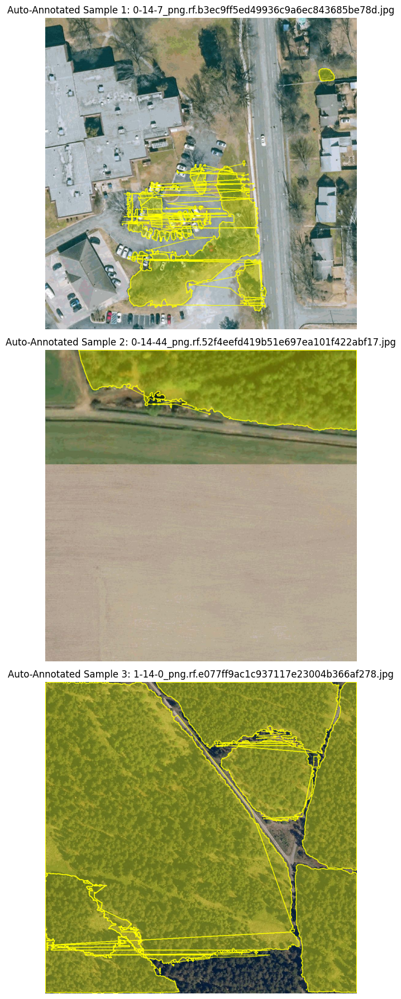

In [ ]:
import glob

def visualize_auto_annotated_samples(image_dir, label_dir, class_names, num_samples=3):
    image_files = [f for f in os.listdir(image_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]
    if not image_files:
        print("No images found to visualize in the auto-annotated dataset.")
        return

    samples = random.sample(image_files, min(len(image_files), num_samples))

    plt.figure(figsize=(20, 6 * num_samples))

    for i, img_file in enumerate(samples):
        # Load Image
        img_path = os.path.join(image_dir, img_file)
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        h, w, _ = image.shape

        # Create a mask overlay
        overlay = image.copy()

        # Load Label
        label_file = img_file.rsplit('.', 1)[0] + ".txt"
        label_path = os.path.join(label_dir, label_file)

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                lines = f.readlines()

            for line in lines:
                data = list(map(float, line.strip().split()))
                class_id = int(data[0])
                # YOLO Seg format: class x1 y1 x2 y2 ... xn yn (normalized)
                coords = data[1:]

                # Reshape to (N, 1, 2) for cv2.polylines
                points = []
                for j in range(0, len(coords), 2):
                    px = int(coords[j] * w)
                    py = int(coords[j+1] * h)
                    points.append([px, py])

                pts = np.array(points, np.int32)
                pts = pts.reshape((-1, 1, 2))

                # Color based on class ID (Golden/Green colors for vegetation)
                color = [(255, 255, 0), (0, 255, 0), (0, 255, 255)][class_id % 3]

                # Draw filled polygon
                cv2.fillPoly(overlay, [pts], color)

                # Draw contours
                cv2.polylines(image, [pts], True, color, 2)

        # Blend overlay with original image
        alpha = 0.4
        image_with_masks = cv2.addWeighted(overlay, alpha, image, 1 - alpha, 0)

        plt.subplot(num_samples, 1, i + 1)
        plt.imshow(image_with_masks)
        plt.axis('off')
        plt.title(f"Auto-Annotated Sample {i+1}: {img_file}")

    plt.tight_layout()
    plt.show()


# Define paths for the auto-annotated dataset
# The images are still in the original validation set's image directory
auto_annotated_img_dir = os.path.join("vegetation-segmentation-4", "valid", "images")
# The labels were generated directly into this folder
auto_annotated_lbl_dir = "auto_labeled_dataset"

# Ensure class_names is available (from previous cells if not already)
if 'class_names' not in locals():
    # Fallback in case previous cells were not run in order
    yaml_path = os.path.join(Config.DATASET_DIR, "data.yaml")
    class_names = parse_yaml_classes(yaml_path)

print("Visualizing auto-annotated samples...")
visualize_auto_annotated_samples(auto_annotated_img_dir, auto_annotated_lbl_dir, class_names, num_samples=3)
